In [1]:
# Import Libraries

# System

import os

# Analysis

import numpy as np # Numerical Analysis
import geopandas as gpd
import rasterio # Rasters

# Visualization

import matplotlib.pyplot as plt
import contextily as ctx

import warnings
warnings.filter_warnings('ignore')

In [3]:
# Load plotting data

raster = np.load('template.npy')

trip = gpd.read_file('DoryTrip.geojson').to_crs('EPSG:26915')

In [74]:
# Just going to do this visually...

# Get groups of tifs to plot together

file_names = np.array(os.listdir('5_weights_tests'))

# No water # selecting 6 plots

no_water_tifs = file_names[['-0W-' in i for i in file_names]]
no_water_tifs.sort()

no_water_select = no_water_tifs[[0, 3, 5, 7, 9, 1]]

# No Field # selecting 6 plots

no_field_tifs = file_names[['-0F-' in i for i in file_names]]
no_field_tifs.sort()

no_field_select = no_field_tifs[[0, 3, 5, 7, 9, 1]]

# Half Surface # 6 plots

half_slope = file_names[['50S-' in i for i in file_names]]
half_slope.sort()


# Half Water # 6 plots

half_water = file_names[['-50W-' in i for i in file_names]]
half_water.sort()

# Half Field # 6 plots

half_field = file_names[['-50F-' in i for i in file_names]]
half_field.sort()

# Plot groups

plot_gps = [no_water_select, no_field_select, half_surface,
               half_water, half_field]

# Plot Group Names

plot_gp_names = ['No Water', 'No Field', '50% Weighted Slope', '50% Weighted Water', '50% Weighted Field']

In [77]:
# Definitions

def six_plot(rast_names, suptitle):
    
    f, axs = plt.subplots(2,3, figsize = (24,16))
    
    for i, ax in enumerate(axs.flatten()):
        
        path = os.path.join('5_weights_tests', rast_names[i])
        
        # Load that raster

        rast = rasterio.open(path) # Open

        values = rast.read(1) # Save band

        rast.close() # Close

        # Plot it

        art = ax.pcolormesh(raster[0], raster[1], values.T, shading='auto', cmap = 'RdBu')#, alpha = 0.4) # Plot interpolation
        title = rast_names[i][:-17]
        ax.set_title(title, fontsize = 16) # Add title
        ax.set_axis_off()

        trip.plot(categorical = True, cmap = 'Dark2',
            # column = 'type', cmap = 'black',
                  # legend = True, 
                  marker = '*', markersize = 200, ax = ax)
    
    
    
    f.colorbar(art, ax=axs[:, :], location='right', shrink=0.85)
    f.suptitle(suptitle, fontsize = 24)
    # f.tight_layout()
    f.savefig(suptitle+'.png', dpi = 300)
    plt.show()

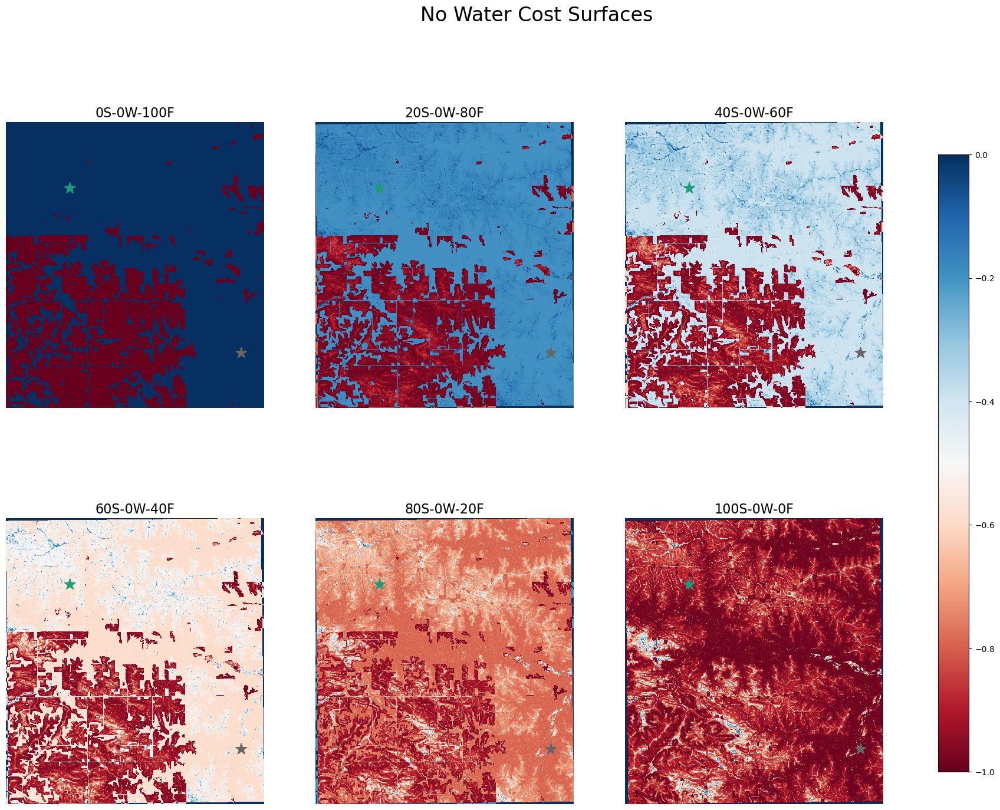

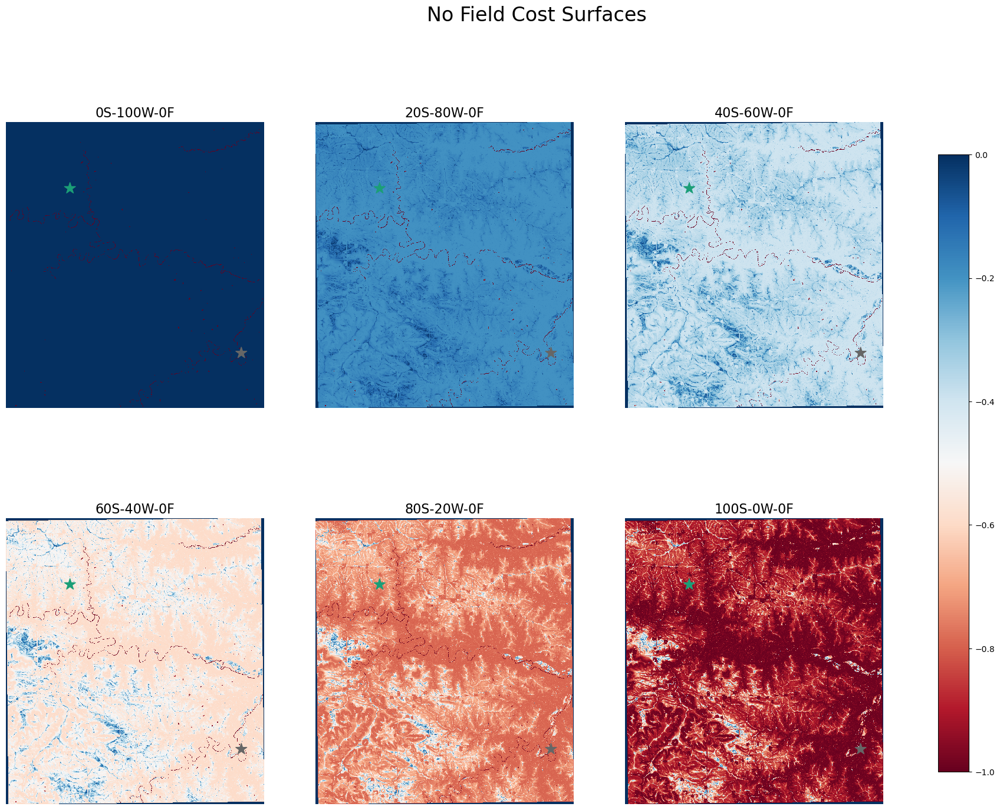

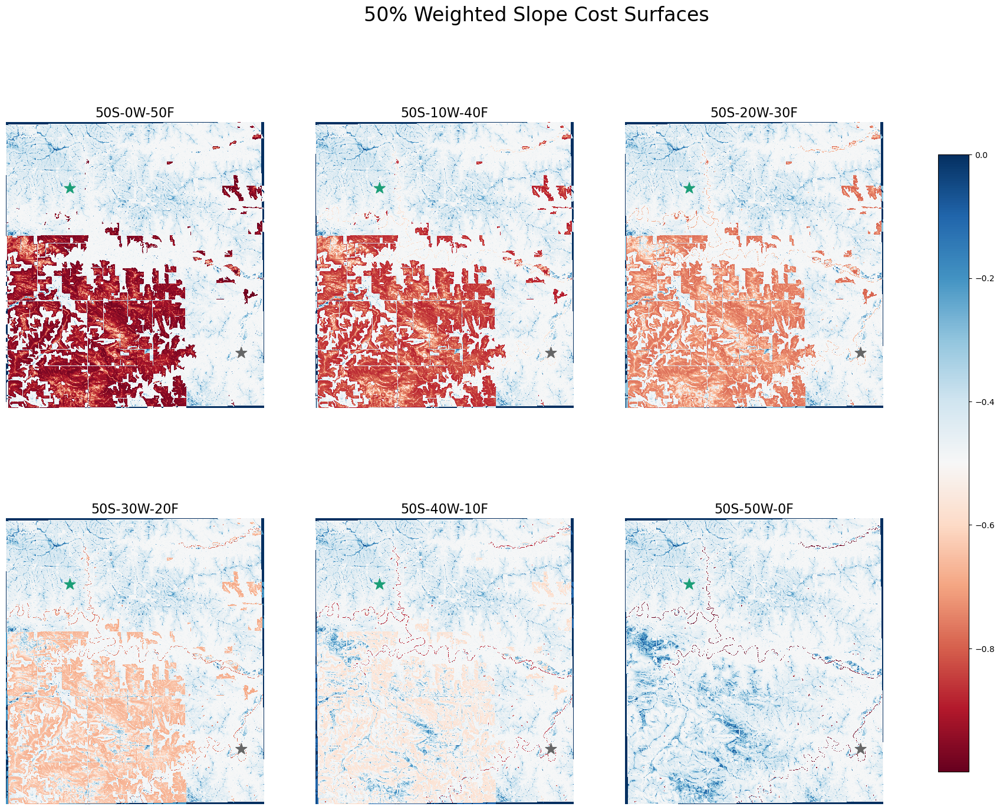

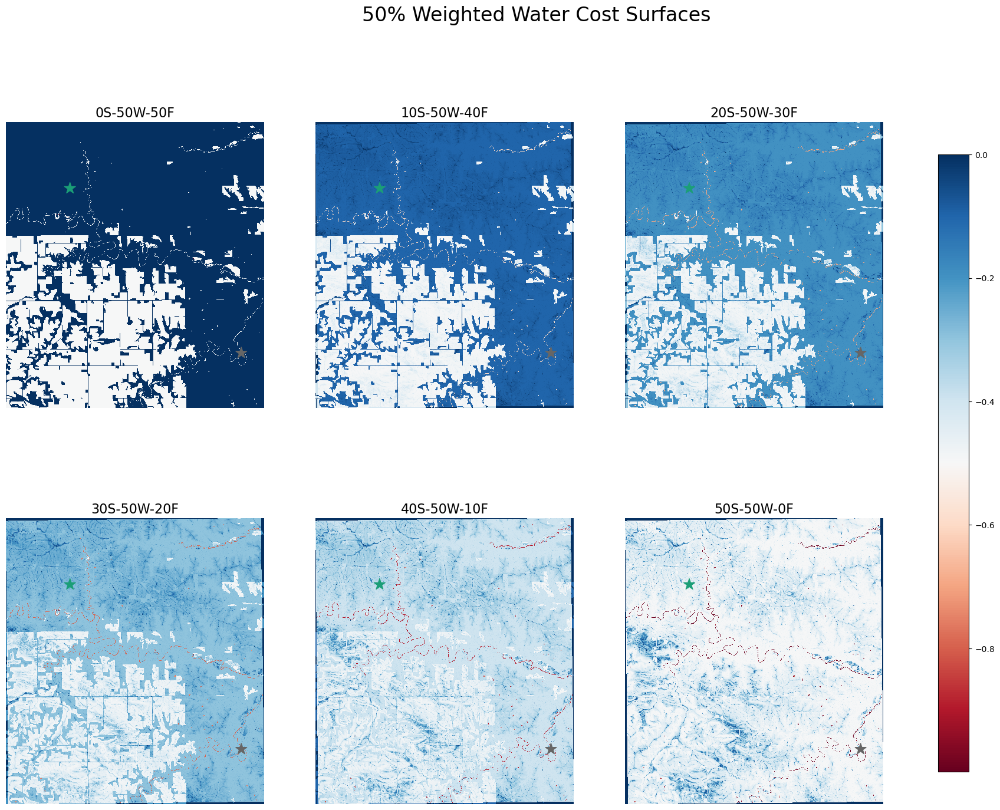

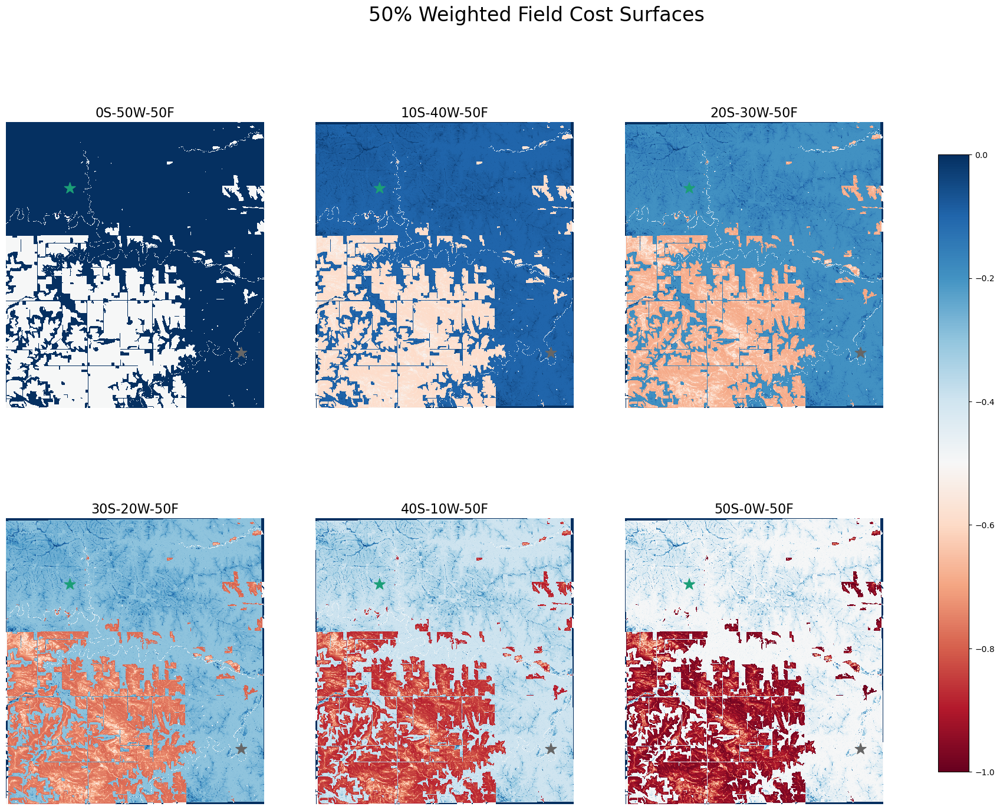

In [78]:
for i, plot_gp in enumerate(plot_gps):
    
    title = plot_gp_names[i] + ' Cost Surfaces'
    
    six_plot(plot_gp, title)

In [79]:
# Seasonal Optimals

plot_gp = ['20S-40W-40F-Cost_Surface.tif',
           '30S-40W-30F-Cost_Surface.tif',
           '50S-40W-10F-Cost_Surface.tif',
           '60S-40W-0F-Cost_Surface.tif']

seasons = ['Spring', 'Summer', 'Fall', 'Winter']

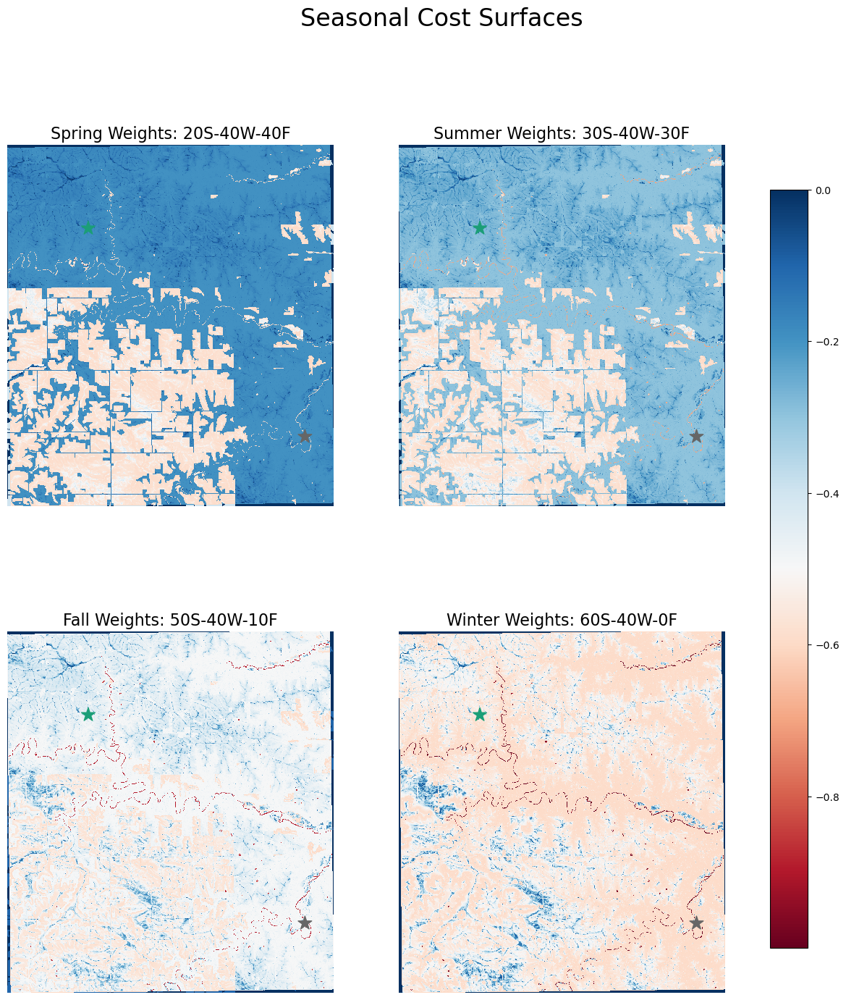

In [82]:
f, axs = plt.subplots(2,2, figsize = (16,16))
    
for i, ax in enumerate(axs.flatten()):

    path = os.path.join('5_weights_tests', plot_gp[i])

    # Load that raster

    rast = rasterio.open(path) # Open

    values = rast.read(1) # Save band

    rast.close() # Close

    # Plot it

    art = ax.pcolormesh(raster[0], raster[1], values.T, shading='auto', cmap = 'RdBu')#, alpha = 0.4) # Plot interpolation
    title = seasons[i] + ' Weights: ' + plot_gp[i][:-17]
    ax.set_title(title, fontsize = 16) # Add title
    ax.set_axis_off()

    trip.plot(categorical = True, cmap = 'Dark2',
        # column = 'type', cmap = 'black',
              # legend = True, 
              marker = '*', markersize = 200, ax = ax)



f.colorbar(art, ax=axs[:, :], location='right', shrink=0.85)
f.suptitle('Seasonal Cost Surfaces', fontsize = 24)
# f.tight_layout()
f.savefig('Seasonal Cost Surfaces.png', dpi = 300)
plt.show()